In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

from funciones import *

# Carga de las imagenes en huecos, grietas y normal.

In [2]:
ruta_imagenes = "../img"
clases = ['normal', 'grieta', 'hueco']

df = load_images(img_directorio_path=ruta_imagenes, classes=clases)

In [3]:
print("Total images: ", df.shape[0])

Total images:  4445


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4445 entries, 0 to 4444
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   imagen color  4445 non-null   object
 1   imagen gris   4445 non-null   object
 2   clase         4445 non-null   object
dtypes: object(3)
memory usage: 104.3+ KB


In [5]:
huecos = list(df[df['clase'] == 'hueco']['imagen gris'])
grietas = list(df[df['clase'] == 'grieta']['imagen gris'])
normal = list(df[df['clase'] == 'normal']['imagen gris'])

### Filtrado y Convolución.

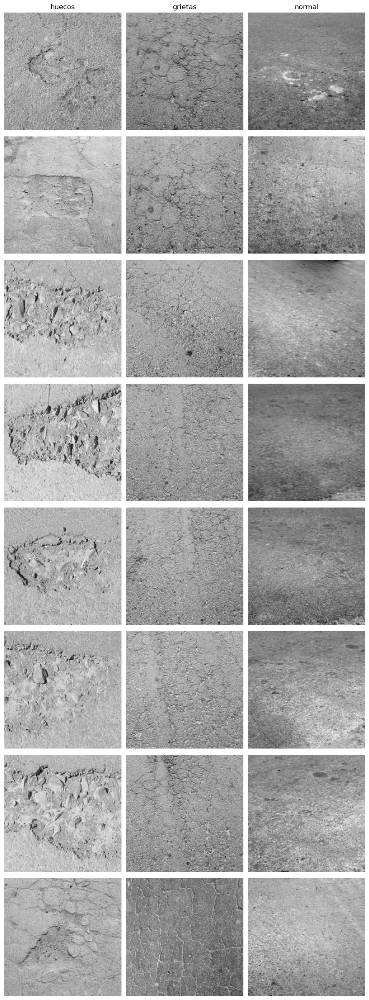

In [7]:
# Graficamos algunas de las imagenes en escala de grises
inicio = 160
final = inicio + 8
graficar = [
    huecos[inicio:final],
    grietas[inicio:final],
    normal[inicio:final],
]

nombres = ['huecos', 'grietas', 'normal']

show_images(graficar, nombres, size=3)

## Filtro de Sobel y Gaussian Blur

Blur: 3, Sobel: 3


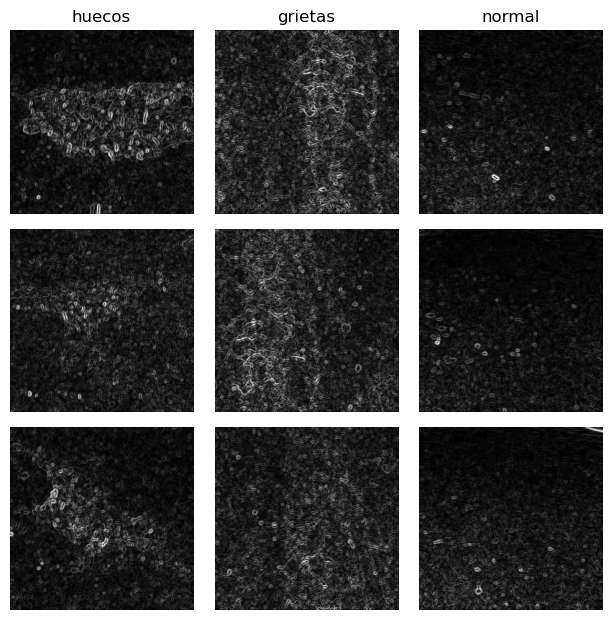

Blur: 3, Sobel: 5


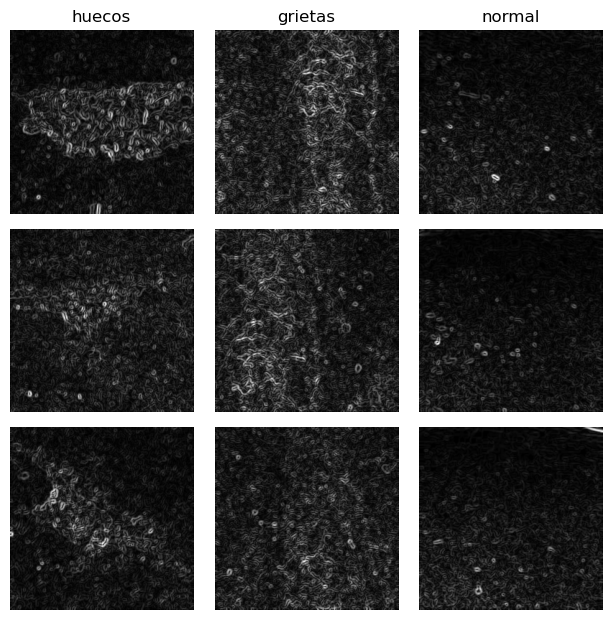

Blur: 3, Sobel: 7


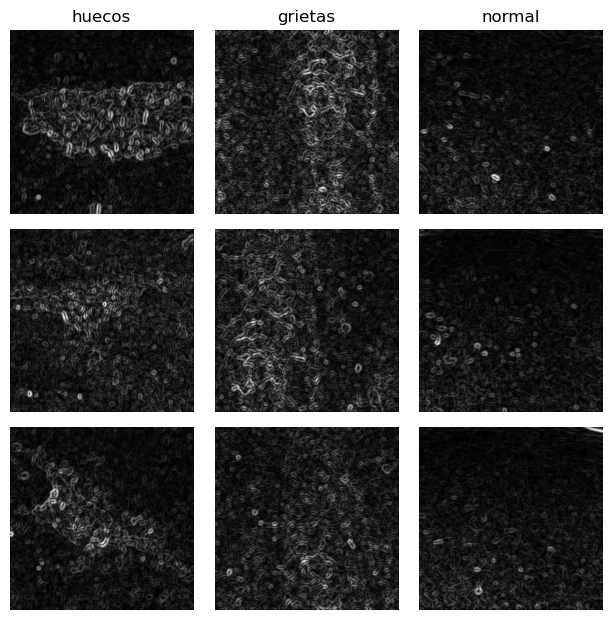

Blur: 5, Sobel: 3


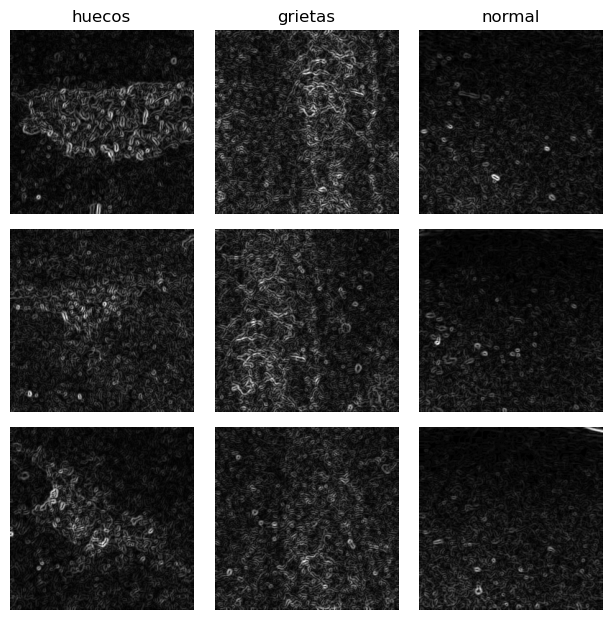

Blur: 5, Sobel: 5


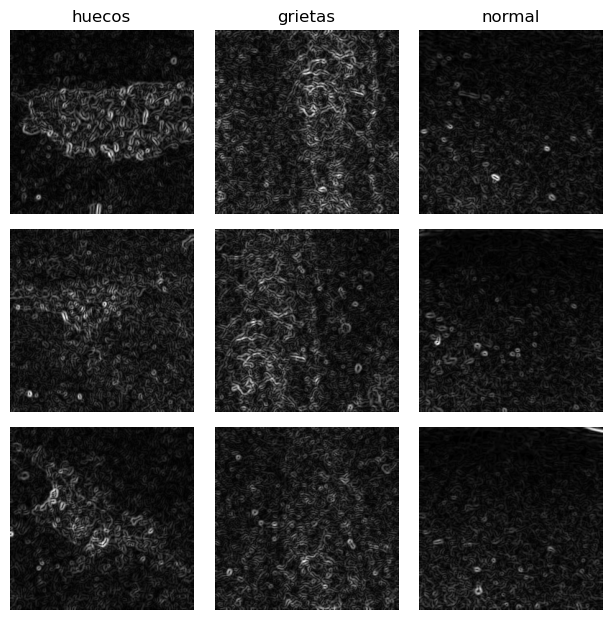

Blur: 5, Sobel: 7


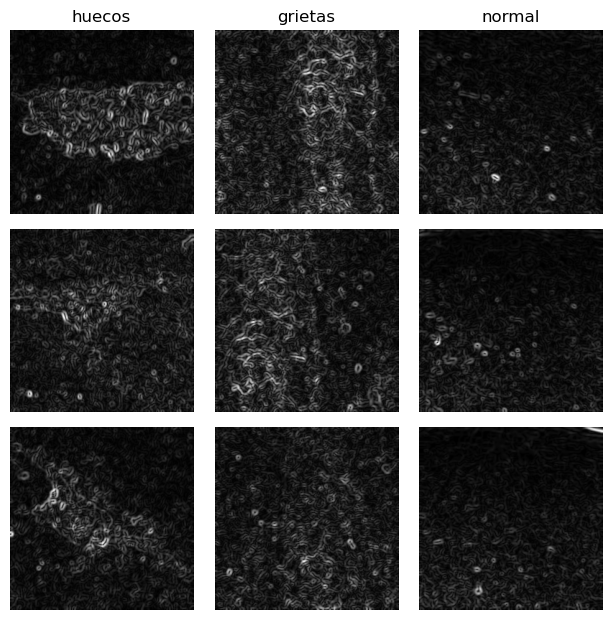

Blur: 7, Sobel: 3


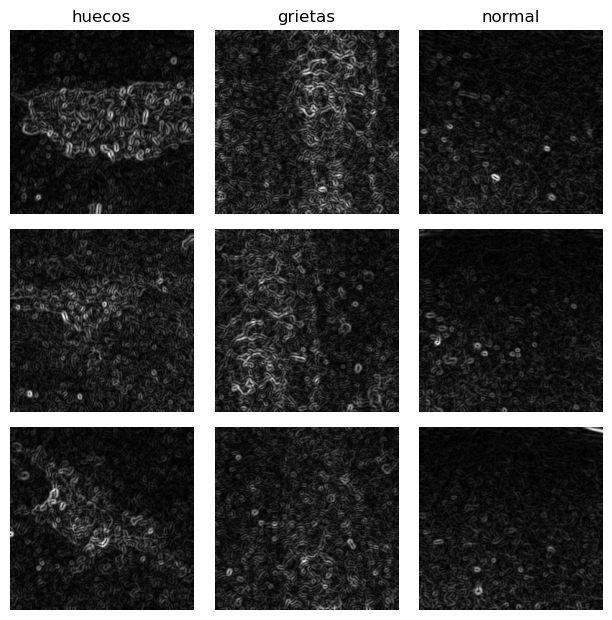

Blur: 7, Sobel: 5


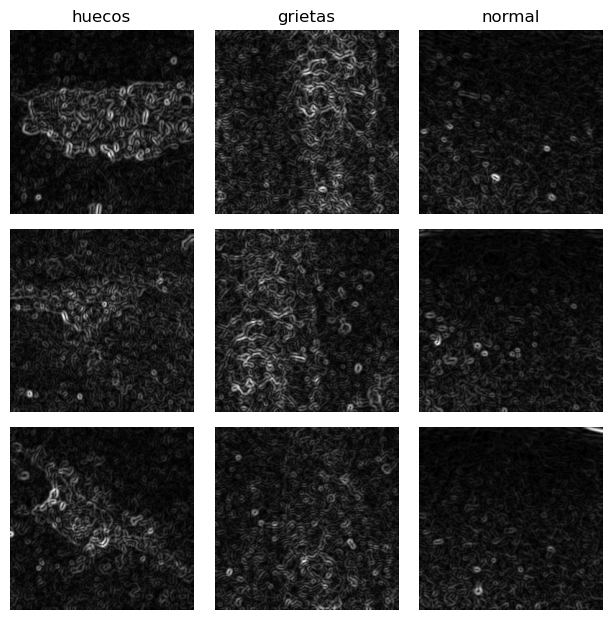

Blur: 7, Sobel: 7


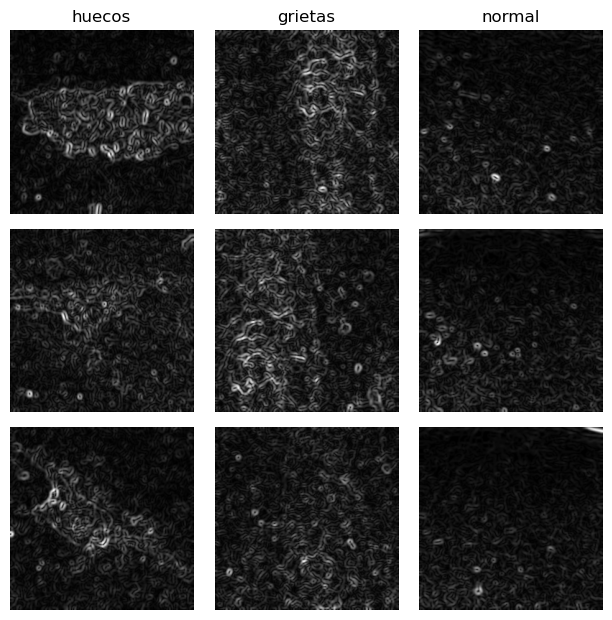

In [8]:
# Se propone realizar una exploración con diversos desenfoques y filtros Sobel

def blur(imagen, k_size):
    return cv2.GaussianBlur(imagen, (k_size,k_size), 0)

def sobel(imagen, k_size):
    sobel_x = cv2.Sobel(imagen, cv2.CV_64F, 1, 0, ksize=k_size)
    sobel_y = cv2.Sobel(imagen, cv2.CV_64F, 0, 1, ksize=k_size)
    return cv2.magnitude(sobel_x, sobel_y)

inicio = 200
final = inicio + 3

for k1 in range(3, 8, 2):
    for k2 in range(3, 8, 2):
        huecos_sobel = []
        for imagen in huecos[inicio:final]:
            imagen = blur(imagen, k1)
            imagen = sobel(imagen, k2)
            huecos_sobel.append(imagen)

        grietas_sobel = []
        for imagen in grietas[inicio:final]:
            imagen = blur(imagen, k1)
            imagen = sobel(imagen, k2)
            grietas_sobel.append(imagen)

        normal_sobel = []
        for imagen in normal[inicio:final]:
            imagen = blur(imagen, k1)
            imagen = sobel(imagen, k2)
            normal_sobel.append(imagen)

        print(f'Blur: {k1}, Sobel: {k2}')
        show_images([huecos_sobel, grietas_sobel, normal_sobel], nombres, size=2.1)

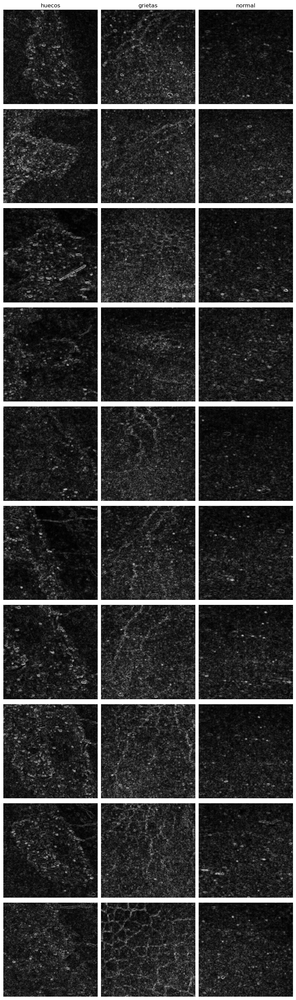

In [9]:
# Filtro de Prewitt

def prewitt(imagen):
    prewitt_x = cv2.filter2D(imagen, cv2.CV_64F, np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]]))
    prewitt_y = cv2.filter2D(imagen, cv2.CV_64F, np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]]))
    return cv2.magnitude(prewitt_x, prewitt_y)
    

inicio = 300
final = inicio + 10


huecos_prewitt = []
for imagen in huecos[inicio:final]:
    imagen = prewitt(imagen)
    huecos_prewitt.append(imagen)

grietas_prewitt = []
for imagen in grietas[inicio:final]:
    imagen = prewitt(imagen)
    grietas_prewitt.append(imagen)

normal_prewitt = []
for imagen in normal[inicio:final]:
    imagen = prewitt(imagen)
    normal_prewitt.append(imagen)

show_images([huecos_prewitt, grietas_prewitt, normal_prewitt], nombres, size=3)